# **Geofencing**

Geofencing is used to determine whether an object is inside or outside an area of interest based on its location (coordinates from a GPS for example). There are several types of geofencing based on the area used, the most commonly used are: **circular, rectangular, polygonal, and corridor**.

## 1. Circular Geofencing

This is the simplest form of geofencing which involves detecting whether an object is within a certain radius of a point of interest.

First, we need to determine the coordinates (latitude & longitude) of our point of interest. Secondly, we need to determine the radius of the circle.

[This tool](https://www.mapdevelopers.com/draw-circle-tool.php) can help you visualize the size of the circle on a map.

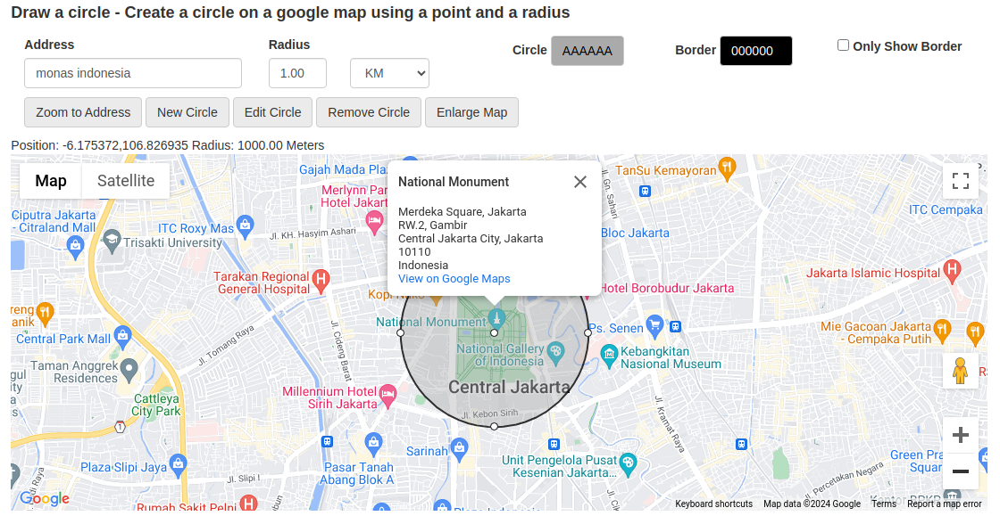

In this example, we want to know whether Stasiun Juanda is within a 1 km radius of the National Monument. To do this, we can simply calculate the distance between Stasiun Juanda and the National Monument using the ***haversine formula*** (read more about it [here](https://community.esri.com/t5/coordinate-reference-systems-blog/distance-on-a-sphere-the-haversine-formula/ba-p/902128#:~:text=For%20example%2C%20haversine(%CE%B8),longitude%20of%20the%20two%20points.)):

In [26]:
from geofencing import is_within_circle

# example
coord_object = (-6.166710,106.830454) # Stasiun Juanda
coord_POI = (-6.175372,106.827149) # National Monument
radius_km = 1

if is_within_circle(coord_object[0], coord_object[1], coord_POI[0], coord_POI[1], radius_km):
    print("Object is within the geofence")
else:
    print("Object is outside the geofence")

Object is outside the geofence


Run the code below to visualize the geofence on a map:

In [27]:
from folium import (
    Map, 
    Circle, 
    Popup, 
    FitOverlays,
)

map = Map(
        location=list(coord_POI),
        zoom_start= 15,
        control=False,
        overlay=False,
)

# geofence
Circle(
    location=list(coord_POI),
    radius=radius_km * 1000,
    color="black",
    dash_array=20,
    weight=5,
    fill_opacity=0.2,
    opacity=1,
    fill_color="black",
).add_to(map)

# poi
radius = 25
Circle(
    location=list(coord_POI),
    radius=radius,
    color="black",
    weight=1,
    fill_opacity=1,
    opacity=1,
    fill_color="white",
    popup=Popup("POI", show=True, sticky=True)
).add_to(map)

# object
color = "green" if is_within_circle(coord_POI[0], coord_POI[1], coord_object[0], coord_object[1], radius_km) else "red"
Circle(
    location=list(coord_object),
    radius=radius,
    color="black",
    weight=1,
    fill_opacity=1,
    opacity=1,
    fill_color=color,
    popup=Popup("Object", show=True, sticky=True)
).add_to(map)

FitOverlays(padding=50).add_to(map)

map

## 2. Rectangular Geofencing

### *Rectangular Geofence with Centroid*

Instead of a circle, we use a rectangle as the boundary of our geofence. The following example creates a rectangular geofence with a point of interest at its centroid:

In [28]:
from geofencing import is_within_rectangle

# example
coord_object = (-6.166710,106.830454) # Stasiun Juanda
coord_POI = (-6.175372,106.827149) # National Monument
rectangle_width_km = 2
rectangle_height_km = 1.5

if is_within_rectangle(
    coord_object[0], 
    coord_object[1], 
    poi_lat=coord_POI[0], 
    poi_lon=coord_POI[1], 
    rectangle_width_km=rectangle_width_km, 
    rectangle_height_km=rectangle_height_km,
):
    print("Object is within the geofence")
else:
    print("Object is outside the geofence")

Object is outside the geofence


Run the code below to visualize the geofence on a map:

In [29]:
from folium import (
    Map, 
    Rectangle, 
    Circle,
    Popup, 
    FitOverlays,
)
from haversine import inverse_haversine, Direction, Unit

map = Map(
        location=list(coord_POI),
        zoom_start= 15,
        control=False,
        overlay=False,
)

# geofence
north_boundary = inverse_haversine((coord_POI[0], coord_POI[1]), (rectangle_height_km / 2), Direction.NORTH, Unit.KILOMETERS)[0]
south_boundary = inverse_haversine((coord_POI[0], coord_POI[1]), (rectangle_height_km / 2), Direction.SOUTH, Unit.KILOMETERS)[0]
east_boundary = inverse_haversine((coord_POI[0], coord_POI[1]), (rectangle_width_km / 2), Direction.EAST, Unit.KILOMETERS)[1]
west_boundary = inverse_haversine((coord_POI[0], coord_POI[1]), (rectangle_width_km / 2), Direction.WEST, Unit.KILOMETERS)[1]
Rectangle(
    bounds=[[north_boundary, west_boundary], [south_boundary, east_boundary]],
    color="black",
    dash_array=20,
    weight=5,
    fill_opacity=0.2,
    opacity=1,
    fill_color="black",
).add_to(map)

# poi
radius = 25
Circle(
    location=list(coord_POI),
    radius=radius,
    color="black",
    weight=1,
    fill_opacity=1,
    opacity=1,
    fill_color="white",
    popup=Popup("POI", show=True, sticky=True)
).add_to(map)

# object
if is_within_rectangle(
    coord_object[0], 
    coord_object[1], 
    poi_lat=coord_POI[0], 
    poi_lon=coord_POI[1], 
    rectangle_height_km=rectangle_height_km,
    rectangle_width_km=rectangle_width_km, 
):
    color = "green"
else:
    color = "red"

Circle(
    location=list(coord_object),
    radius=radius,
    color="black",
    weight=1,
    fill_opacity=1,
    opacity=1,
    fill_color=color,
    popup=Popup("Object", show=True, sticky=True)
).add_to(map)

FitOverlays(padding=50).add_to(map)

map

### *Rectangular Geofence using Boundaries*

We can also create a rectangular geofence simply by defining the latitude & longitude boundaries, without having a centroid.

Latitude determines how far north (+) or south (-), while longitude determines how far east (+) or west (-).

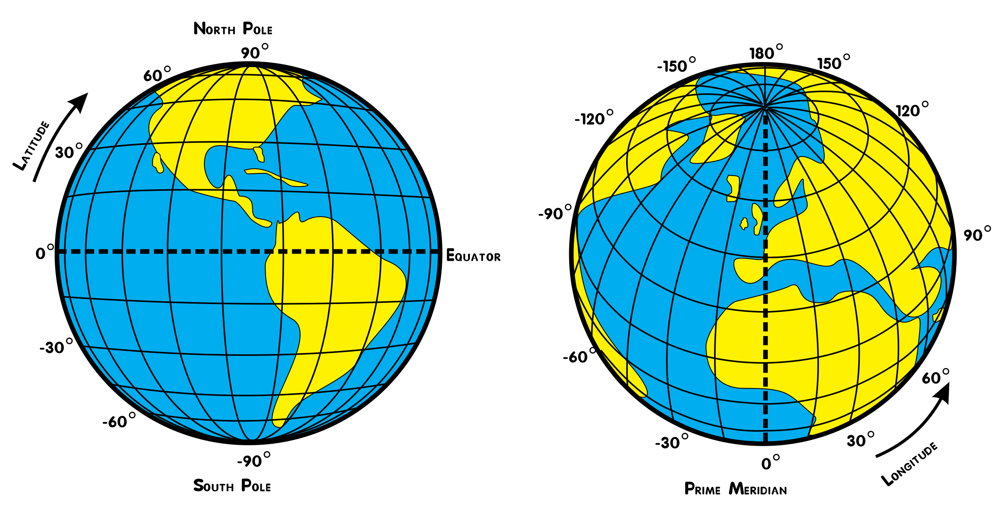

The idea is to define north-south latitudes and east-west longitudes as boundaries of our rectangle. This [polyline tool](https://www.keene.edu/campus/maps/tool/) can be helpful to figure out the boundaries that we need:

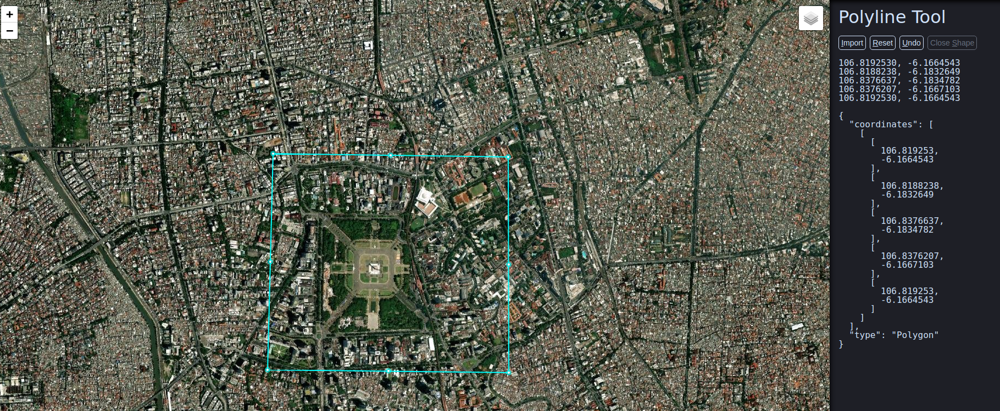

Now we just need to check whether the object is within the boundaries we set:

In [30]:
from geofencing import is_within_rectangle

# example
north_to_south = (-6.1664543,-6.1834782)
west_to_east = (106.818823,106.837663)
coord_object = (-6.166710,106.830454) # Stasiun Juanda

if is_within_rectangle(
    coord_object[0], 
    coord_object[1], 
    north_boundary=north_to_south[0],
    south_boundary=north_to_south[1],
    west_boundary=west_to_east[0],
    east_boundary=west_to_east[1]
):
    print("Object is within the geofence")
else:
    print("Object is outside the geofence")

Object is within the geofence


Run the code below to visualize the geofence on a map:

In [31]:
from folium import (
    Map, 
    Rectangle, 
    Circle,
    Popup, 
    FitOverlays,
)

map = Map(
        zoom_start= 15,
        control=False,
        overlay=False,
)

# geofence
Rectangle(
    bounds=[[north_to_south[0], west_to_east[0]], [north_to_south[1], west_to_east[1]]],
    color="black",
    dash_array=20,
    weight=5,
    fill_opacity=0.2,
    opacity=1,
    fill_color="black",
).add_to(map)

# object
if is_within_rectangle(
    coord_object[0], 
    coord_object[1], 
    north_boundary=north_to_south[0],
    south_boundary=north_to_south[1],
    west_boundary=west_to_east[0],
    east_boundary=west_to_east[1]
):
    color = "green"
else:
    color = "red"

radius = 25
Circle(
    location=list(coord_object),
    radius=radius,
    color="black",
    weight=1,
    fill_opacity=1,
    opacity=1,
    fill_color=color,
    popup=Popup("Object", show=True, sticky=True)
).add_to(map)

FitOverlays(padding=50).add_to(map)

map

## 3. Polygonal Geofencing

### *Creating Polygons Using Polylines*

For more complex areas, polygons can be used to define the geofence. 

The previously mentioned [polyline tool](https://www.keene.edu/campus/maps/tool/) can be helpful to figure out the boundaries that we need (**NOTE:** latitudes and longitudes are reversed in the polyline tool):

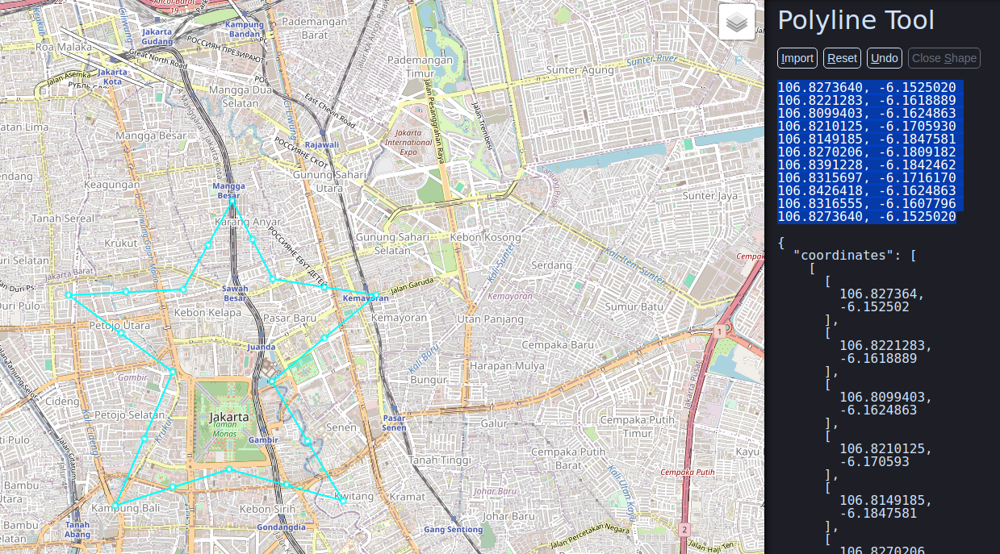

Now to check whether the object is within the polygon:

In [32]:
from geofencing import is_within_polygon

# example
polygon_coordinates = [
    (-6.1525020, 106.8273640),
    (-6.1618889, 106.8221283),
    (-6.1624863, 106.8099403),
    (-6.1705930, 106.8210125),
    (-6.1847581, 106.8149185),
    (-6.1809182, 106.8270206),
    (-6.1842462, 106.8391228),
    (-6.1716170, 106.8315697),
    (-6.1624863, 106.8426418),
    (-6.1607796, 106.8316555),
    (-6.1525020, 106.8273640),
]
coord_object = (-6.166710,106.830454) # Stasiun Juanda

if is_within_polygon(
    coord_object[0], 
    coord_object[1], 
    polygon_coordinates
):
    print("Object is within the geofence")
else:
    print("Object is outside the geofence")

Object is within the geofence


Run the code below to visualize the geofence on a map:

In [33]:
from folium import (
    Map, 
    Polygon,
    Circle,
    Popup, 
    FitOverlays,
)

map = Map(
        zoom_start= 15,
        control=False,
        overlay=False,
)

# geofence
Polygon(
    locations=polygon_coordinates,
    color="black",
    dash_array=20,
    weight=5,
    fill_opacity=0.2,
    opacity=1,
    fill_color="black",
).add_to(map)

# object
color = "green" if is_within_polygon(coord_object[0], coord_object[1], polygon_coordinates) else "red"
radius = 25
Circle(
    location=list(coord_object),
    radius=radius,
    color="black",
    weight=1,
    fill_opacity=1,
    opacity=1,
    fill_color=color,
    popup=Popup("Object", show=True, sticky=True)
).add_to(map)

FitOverlays(padding=50).add_to(map)

map

### *Creating Polygons from Existing Areas*

Instead of creating our own polygon, we can also use existing geographic boundaries such as cities, states, etc. as our geofence. This can be done using data from OpenStreetMap.

[This answer on GIS StackExchange](https://gis.stackexchange.com/a/192298) specifies one way to extract coordinates of an area using GeoJSON or polygon files. Another way would be to use a package called [osmexp](https://github.com/Racum/osmexp) to obtain geoJSON of an area using its OSM ID, which is what we'll use.

First, we need to obtain the OSM ID of our desired area via https://nominatim.openstreetmap.org. As an example, here is a residential area in Indonesia called Alam Sutera:

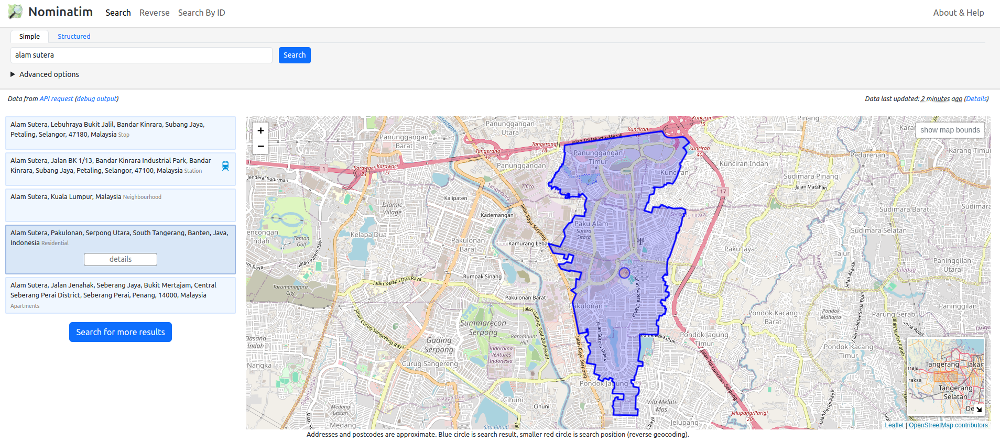

If we click 'details', we'll find the OSM ID as highlighted below. In this case, it is 'way 363955957':

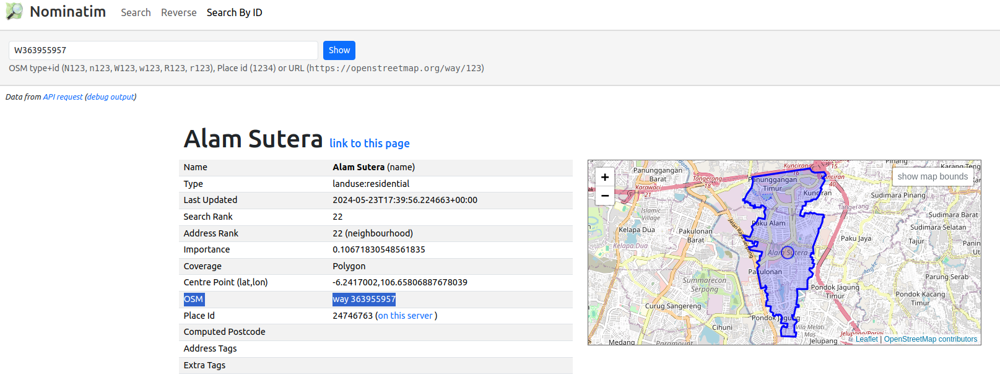

Now to get the geoJSON file and extract the coordinates of the area:

In [34]:
from subprocess import run, PIPE
from json import load
from geojson.utils import coords

osm_id = 'way 363955957' # alam sutera
# osm_id = 'rel 10759331' # for relations, use 'rel'. e.g. bsd city's OSM ID is 'relation 10759331'

output_file = osm_id.replace(" ", "") + ".geojson"
command = 'osmexp ' + osm_id

# obtain geoJSON and save to output file
with open(output_file, 'w') as f:
    result = run(command.split(), stdout=f, stderr=PIPE, text=True)

with open(output_file, 'r') as f:
    area_geojson = load(f)

area_coordinates = coords(area_geojson)

# reverse latitude and longitude order
polygon_coordinates = [[lat, lon] for lon, lat in area_coordinates]

Finally, we can use these coordinates to create our geofence:

In [35]:
from geofencing import is_within_polygon

# example
coord_object = (-6.24398767214986, 106.65293301353276) # living world, a mall in alam sutera

if is_within_polygon(
    coord_object[0], 
    coord_object[1], 
    polygon_coordinates
):
    print("Object is within the geofence")
else:
    print("Object is outside the geofence")

Object is within the geofence


Run the code below to visualize the geofence on a map:

In [36]:
from folium import (
    Map, 
    Polygon, 
    Circle,
    Popup, 
    FitOverlays,
)

map = Map(
        zoom_start= 15,
        control=False,
        overlay=False,
)

# geofence
Polygon(
    locations=polygon_coordinates,
    color="black",
    dash_array=20,
    weight=5,
    fill_opacity=0.2,
    opacity=1,
    fill_color="black",
).add_to(map)

# object
color = "green" if is_within_polygon(coord_object[0], coord_object[1], polygon_coordinates) else "red"
radius = 25
Circle(
    location=list(coord_object),
    radius=radius,
    color="black",
    weight=1,
    fill_opacity=1,
    opacity=1,
    fill_color=color,
    popup=Popup("Object", show=True, sticky=True)
).add_to(map)

FitOverlays(padding=50).add_to(map)

map

## 4. Corridor Geofencing

This type of geofence can be useful when we are looking to track whether an asset is following a prescribed route. In this case, we create a geofence around the whole route.

To create a route, we could use the previously mentioned polyline tool. But a better option would be to use open source routing services. In this example, we'll be using [open route service](https://github.com/GIScience/openrouteservice-py). We can visualize the route using [their map](https://maps.openrouteservice.org/):

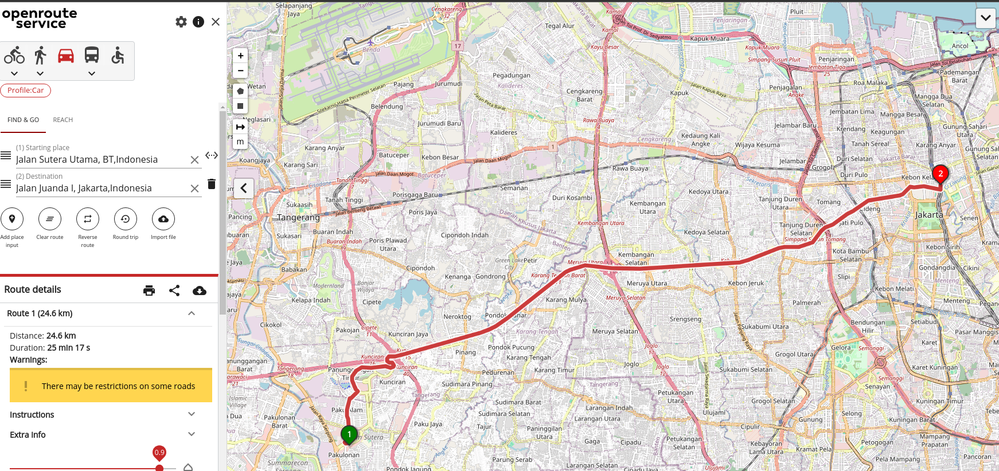

Take note of the coordinates of the starting place and destinations. Now we can request the polyline of this route using the openrouteservice package. **NOTE:** we will need an API key, which can be obtained by creating an account [here](https://openrouteservice.org/dev/).

In [37]:
from openrouteservice import Client, directions, convert
from dotenv import load_dotenv
from os import getenv

# (longitude,latitude), can be more than one destinations
start_finish_coords = ((106.65336370468141,-6.244337238219721),(106.8304458260536,-6.166664973996782))

# comment these two lines if you are not using dotenv
load_dotenv()
api_key = getenv('ORS_API_KEY')

try:
    client = Client(
        key=api_key, # replace with your personal API key
        timeout=120,
    )
    route = directions.directions(client, start_finish_coords)

except Exception as e:
    print(e)
    
else:
    # extract coordinates from route
    polyline = convert.decode_polyline(route['routes'][0]['geometry'])
    polyline_coordinates = [[lat,lon] for lon, lat in polyline['coordinates']] # reverse latitude longitude order

Now to create a geofence around this route:

In [38]:
from geofencing import is_within_corridor

coord_object = (-6.212599, 106.685755)
geofence_radius = 0.0005

if is_within_corridor(
    coord_object[0], 
    coord_object[1], 
    polyline_coordinates,
    geofence_radius,
):
    print("Object is within the geofence")
else:
    print("Object is outside the geofence")

Object is within the geofence


Run the code below to visualize the geofence on a map:

In [39]:
from folium import (
    Map, 
    Polygon,
    PolyLine,
    Circle,
    Popup, 
    FitOverlays,
)
from shapely import LineString, buffer, get_coordinates

map = Map(
        zoom_start= 15,
        control=False,
        overlay=False,
)

# geofence
route_geofence = buffer(
        geometry=LineString(polyline_coordinates),
        distance=geofence_radius,
)
Polygon(
    locations=get_coordinates(route_geofence),
    color="black",
    dash_array=20,
    weight=5,
    fill_opacity=0.2,
    opacity=1,
    fill_color="black",
).add_to(map)

# PolyLine(
#     locations=polyline_coordinates,
#     color="black",
#     weight=5,
#     opacity=1,
# ).add_to(map)

# object
color = "green" if is_within_corridor(coord_object[0], coord_object[1], polyline_coordinates, geofence_radius) else "red"
radius = 25
Circle(
    location=list(coord_object),
    radius=radius,
    color="black",
    weight=1,
    fill_opacity=1,
    opacity=1,
    fill_color=color,
    popup=Popup("Object", show=True, sticky=True)
).add_to(map)

FitOverlays(padding=50).add_to(map)

map